In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

In [2]:
df=pd.read_excel('Churn (1) (2).xlsx')

In [3]:
df.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [4]:
df.shape

(5000, 21)

In [5]:
df = df.drop(df.columns[0], axis=1)

In [6]:
df.shape

(5000, 20)

In [7]:
df.columns

Index(['state', 'area.code', 'account.length', 'voice.plan', 'voice.messages',
       'intl.plan', 'intl.mins', 'intl.calls', 'intl.charge', 'day.mins',
       'day.calls', 'day.charge', 'eve.mins', 'eve.calls', 'eve.charge',
       'night.mins', 'night.calls', 'night.charge', 'customer.calls', 'churn'],
      dtype='object')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           5000 non-null   object 
 1   area.code       5000 non-null   object 
 2   account.length  5000 non-null   int64  
 3   voice.plan      5000 non-null   object 
 4   voice.messages  5000 non-null   int64  
 5   intl.plan       5000 non-null   object 
 6   intl.mins       5000 non-null   float64
 7   intl.calls      5000 non-null   int64  
 8   intl.charge     5000 non-null   float64
 9   day.mins        5000 non-null   float64
 10  day.calls       5000 non-null   int64  
 11  day.charge      5000 non-null   object 
 12  eve.mins        5000 non-null   object 
 13  eve.calls       5000 non-null   int64  
 14  eve.charge      5000 non-null   float64
 15  night.mins      5000 non-null   float64
 16  night.calls     5000 non-null   int64  
 17  night.charge    5000 non-null   f

In [9]:
df.describe()

,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [10]:
df.isnull().any()

state             False
area.code         False
account.length    False
voice.plan        False
voice.messages    False
intl.plan         False
intl.mins         False
intl.calls        False
intl.charge       False
day.mins          False
day.calls         False
day.charge        False
eve.mins          False
eve.calls         False
eve.charge        False
night.mins        False
night.calls       False
night.charge      False
customer.calls    False
churn             False
dtype: bool

In [11]:
df.duplicated().any()

False

In [12]:
categorical_columns = df.select_dtypes(include=['object']).columns

In [13]:
categorical_columns

Index(['state', 'area.code', 'voice.plan', 'intl.plan', 'day.charge',
       'eve.mins', 'churn'],
      dtype='object')

In [14]:

# In categorical_columns we have day.charge and eve.mins which should be numerical column. Hence we should replace Nan value in the dataset with 0

df['eve.mins'] = df['eve.mins'].replace('Nan', 0)
df['day.charge'] = df['day.charge'].replace('Nan', 0)

In [15]:
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns

Index(['state', 'area.code', 'voice.plan', 'intl.plan', 'churn'], dtype='object')

In [16]:
len(categorical_columns)

5

In [17]:
numerical_columns = df.select_dtypes(include=['number']).columns
numerical_columns

Index(['account.length', 'voice.messages', 'intl.mins', 'intl.calls',
       'intl.charge', 'day.mins', 'day.calls', 'day.charge', 'eve.mins',
       'eve.calls', 'eve.charge', 'night.mins', 'night.calls', 'night.charge',
       'customer.calls'],
      dtype='object')

In [18]:
len(numerical_columns)

15

## Outlier Detection

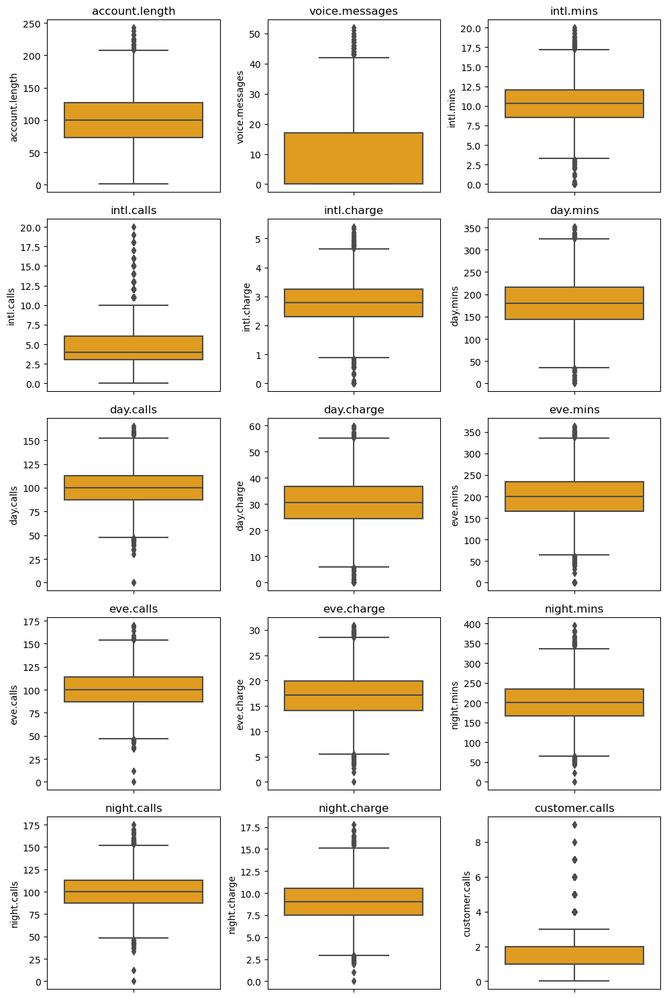

In [19]:
plt.figure(figsize=(10, 15))

for i, col in enumerate(numerical_columns, 1):
    plt.subplot(5, 3, i)
    sns.boxplot(y=df[col], color="orange")
    plt.title(col)

plt.tight_layout()
plt.show()

### Outlier detection using IQR method

In [20]:
for i in numerical_columns:
    Q1=df[i].quantile(0.25)
    Q3=df[i].quantile(0.75)
    IQR=Q3-Q1
lower_bound=Q1-1.5*IQR
upper_bound=Q3+1.5*IQR
outlier=df[(df[i] < lower_bound) | (df[i] > upper_bound)]
outlier

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
10,IN,area_code_415,65,no,0,no,12.7,6,3.43,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,4,yes
14,IA,area_code_415,62,no,0,no,13.1,6,3.54,120.7,70,20.52,307.2,76,26.11,203.0,99,9.14,4,no
15,NY,area_code_415,161,no,0,no,5.4,9,1.46,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,4,yes
21,CO,area_code_408,77,no,0,no,5.7,6,1.54,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5,yes
48,ID,area_code_415,119,no,0,no,8.8,3,2.38,159.1,114,27.05,231.3,117,19.66,143.2,91,6.44,5,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4934,MN,area_code_415,120,no,0,no,8.3,10,2.24,198.0,101,33.66,190.2,74,16.17,241.2,105,10.85,4,no
4939,MN,area_code_408,30,no,0,no,11.3,7,3.05,112.9,81,19.19,224.8,68,19.11,188.4,122,8.48,4,yes
4947,OK,area_code_408,50,no,0,no,10.5,5,2.84,198.7,114,33.78,141.5,90,12.03,293.0,79,13.18,4,no
4953,ME,area_code_415,90,no,0,no,8.7,5,2.35,104.0,104,17.68,170.9,106,14.53,158.8,99,7.15,4,yes


In [21]:
Total_outlier_percentage=(outlier.size/df.size)*100

In [22]:
Total_outlier_percentage

7.9799999999999995

## Removing outliers using IQR method

In [23]:
def remove_outliers_iqr(df):
    numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_features:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df


In [24]:
df = remove_outliers_iqr(df)

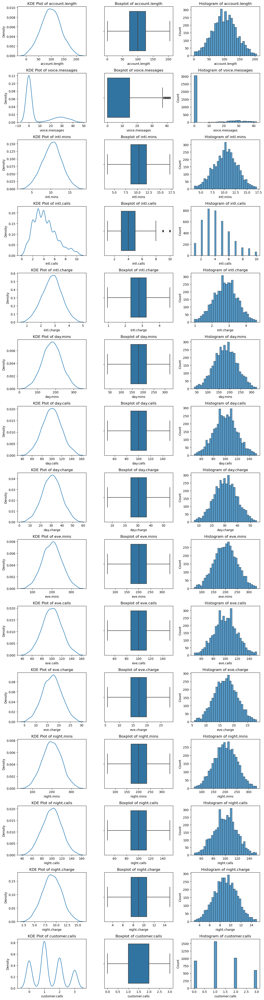

In [25]:
fig, axes = plt.subplots(len(numerical_columns), 3, figsize=(12, 3 * len(numerical_columns)))

for i, col in enumerate(numerical_columns):
    # KDE plot
    sns.kdeplot(df[col], ax=axes[i, 0])
    axes[i, 0].set_title(f'KDE Plot of {col}')

    # Boxplot
    sns.boxplot(x=df[col], ax=axes[i, 1])
    axes[i, 1].set_title(f'Boxplot of {col}')

    # Histogram
    sns.histplot(df[col], ax=axes[i, 2])
    axes[i, 2].set_title(f'Histogram of {col}')

plt.tight_layout()
plt.show()

## Check data is Leaner or NonLearn 

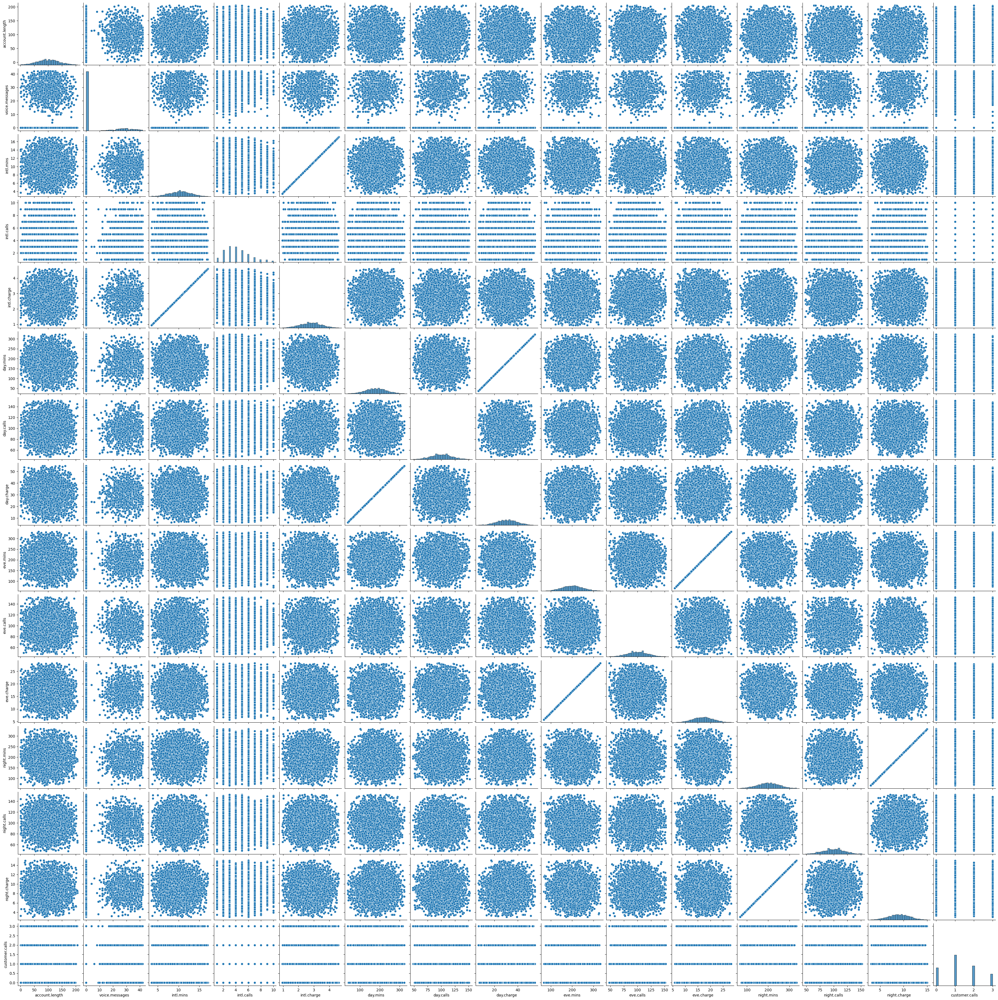

In [26]:
sns.pairplot(df)

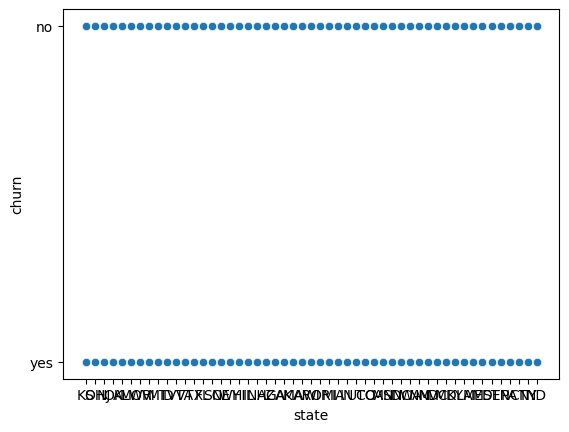

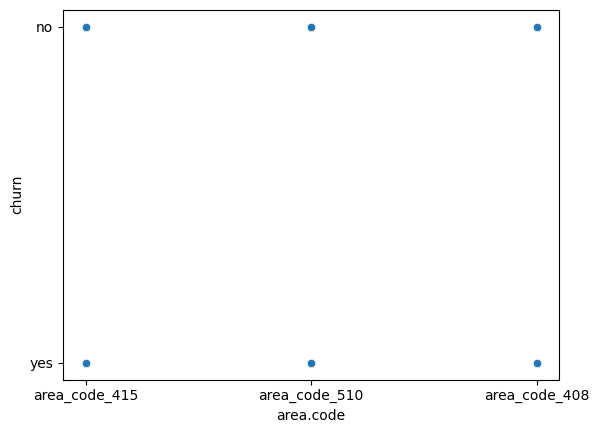

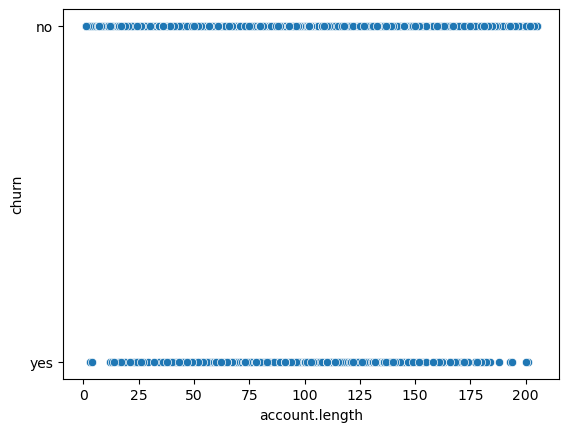

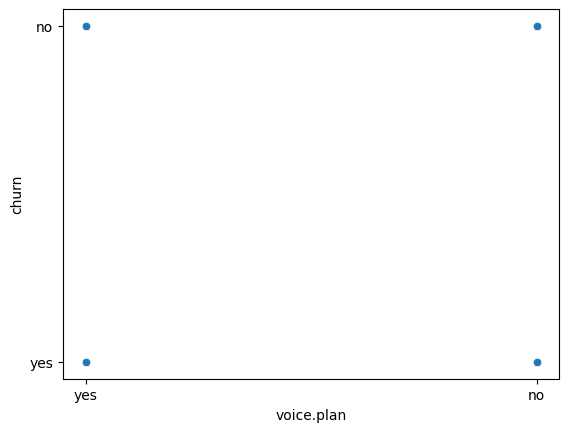

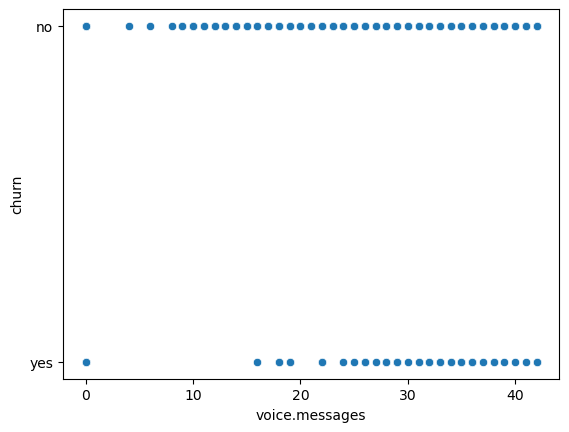

...

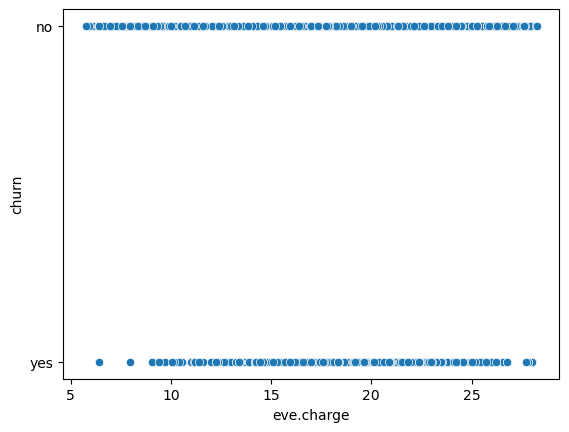

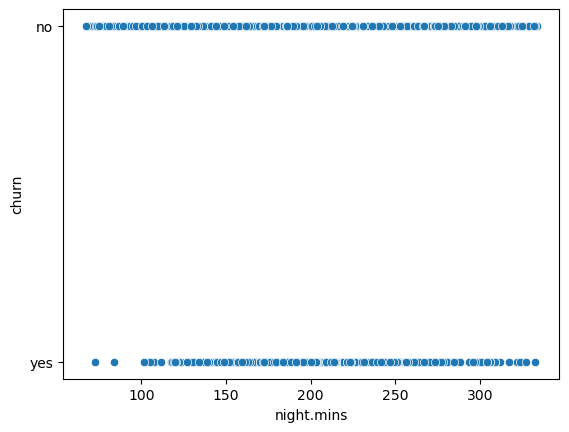

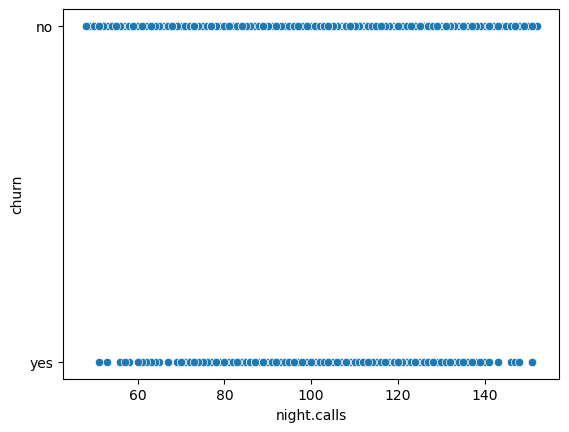

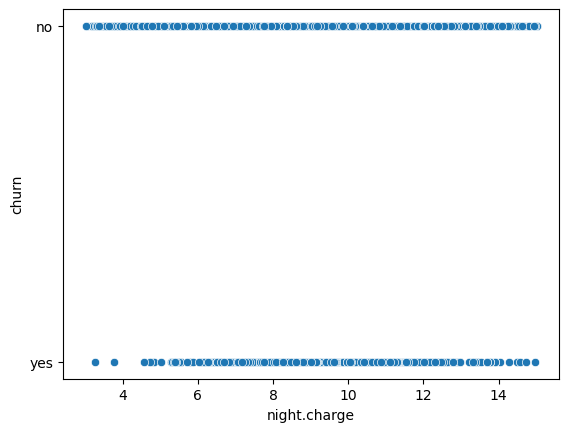

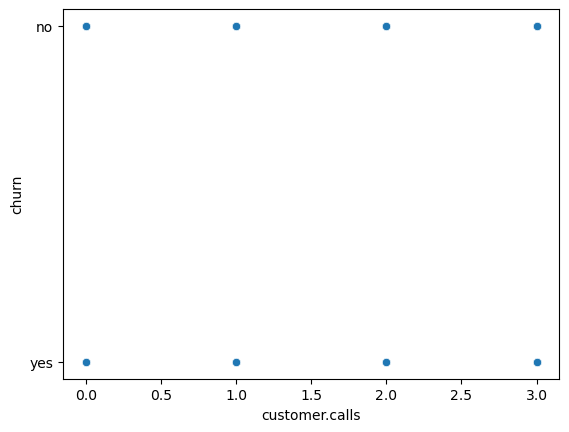

In [27]:
# plot scatterplot to check the distribution of features with respect to target

for column in df.columns[:-1]: 
    sns.scatterplot(x=df[column], y=df["churn"])
    plt.show()

# FEATURE ENGINEERING 

## Find Correlation

In [28]:
correlation_matrix=df.corr(method='spearman')        # Data has outlier and also nonlinear so I have used spearman correlation
correlation_matrix

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_2384\1339716146.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix=df.corr(method='spearman')        # Data has outlier and also nonlinear so I have used spearman correlation


,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
account.length,1.000000,-0.009955,0.013916,0.019586,0.013916,-0.000951,0.027121,-0.000951,-0.007601,0.014325,-0.007597,-0.002041,0.001690,-0.002054,-0.013087
voice.messages,-0.009955,1.000000,0.004487,-0.024602,0.004487,0.017811,-0.003636,0.017811,0.020715,-0.003841,0.020725,0.000121,-0.002388,0.000106,-0.013457
intl.mins,0.013916,0.004487,1.000000,-0.005331,1.000000,-0.016201,0.001314,-0.016201,0.009665,-0.005672,0.009656,-0.006749,0.010017,-0.006720,-0.010463
intl.calls,0.019586,-0.024602,-0.005331,1.000000,-0.005331,-0.016756,0.014201,-0.016756,0.009338,0.000582,0.009337,-0.006472,-0.002032,-0.006449,0.007452
intl.charge,0.013916,0.004487,1.000000,-0.005331,1.000000,-0.016201,0.001314,-0.016201,0.009665,-0.005672,0.009656,-0.006749,0.010017,-0.006720,-0.010463
day.mins,-0.000951,0.017811,-0.016201,-0.016756,-0.016201,1.000000,0.010038,1.000000,-0.015002,-0.002453,-0.015024,0.000092,-0.010649,0.000077,-0.006669
day.calls,0.027121,-0.003636,0.001314,0.014201,0.001314,0.010038,1.000000,0.010038,0.009252,0.015992,0.009250,0.006546,-0.000427,0.006515,-0.027741
day.charge,-0.000951,0.017811,-0.016201,-0.016756,-0.016201,1.000000,0.010038,1.000000,-0.015002,-0.002453,-0.015024,0.000092,-0.010649,0.000077,-0.006669
eve.mins,-0.007601,0.020715,0.009665,0.009338,0.009665,-0.015002,0.009252,-0.015002,1.000000,-0.003429,1.000000,-0.017779,0.011819,-0.017780,-0.027238
eve.calls,0.014325,-0.003841,-0.005672,0.000582,-0.005672,-0.002453,0.015992,-0.002453,-0.003429,1.000000,-0.003421,0.020741,-0.017504,0.020800,0.001747


<Axes: >

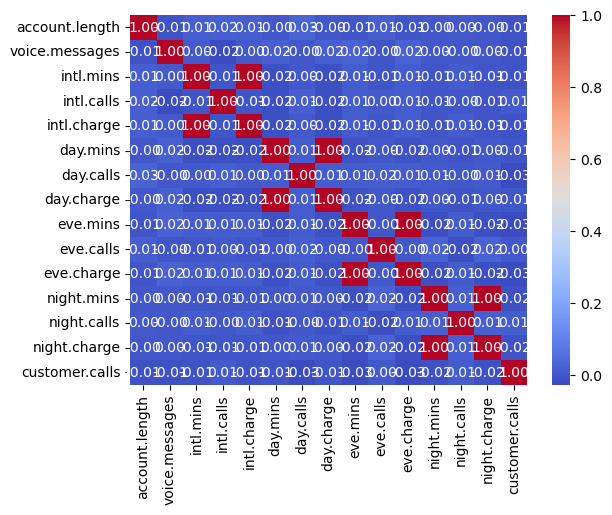

In [29]:
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')

### # Use VIF to find Multicolinearity 


In [30]:

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame()
vif_data["Feature"] = df[numerical_columns].columns
vif_data["VIF"] = [variance_inflation_factor(df[numerical_columns].values, i) for i in range(df[numerical_columns].shape[1])]

print(vif_data)

           Feature           VIF
0   account.length  7.216680e+00
1   voice.messages  1.320395e+00
2        intl.mins  1.002188e+06
3       intl.calls  5.140339e+00
4      intl.charge  1.002768e+06
5         day.mins  1.238362e+08
6        day.calls  2.377585e+01
7       day.charge  1.238419e+08
8         eve.mins  3.701082e+07
9        eve.calls  2.343188e+01
10      eve.charge  3.701126e+07
11      night.mins  1.057160e+07
12     night.calls  2.330840e+01
13    night.charge  1.057166e+07
14  customer.calls  2.777051e+00


#### Here we are getting some moderate multicolinearity

In [31]:
## PPS SCORE

import ppscore as pps

pps_matrix = pps.matrix(df)

pps_matrix.columns

pps_matrix_filtered = pps_matrix[['x', 'y', 'ppscore']].query("y == 'churn'")
print(pps_matrix_filtered)

                  x      y   ppscore
19            state  churn  0.000002
39        area.code  churn  0.000002
59   account.length  churn  0.000000
79       voice.plan  churn  0.000002
99   voice.messages  churn  0.000002
119       intl.plan  churn  0.000002
139       intl.mins  churn  0.000000
159      intl.calls  churn  0.000002
179     intl.charge  churn  0.000000
199        day.mins  churn  0.114225
219       day.calls  churn  0.000002
239      day.charge  churn  0.107491
259        eve.mins  churn  0.000000
279       eve.calls  churn  0.002198
299      eve.charge  churn  0.000000
319      night.mins  churn  0.000000
339     night.calls  churn  0.000002
359    night.charge  churn  0.000000
379  customer.calls  churn  0.000002
399           churn  churn  1.000000


## Encode categorical and numerical column

In [32]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

binary_col = ["voice.plan", "intl.plan", "churn"]
lebel = LabelEncoder()
for col in binary_col:
    df[col] = lebel.fit_transform(df[col])


df = pd.get_dummies(df, columns=["state", "area.code"], drop_first=True)

# Here applying Lable encoder for only binary categorical columns only

In [33]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])


In [34]:
df.head()

,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area.code_area_code_415,area.code_area_code_510
0,0.725935,1,1.355583,0,-0.123083,-0.612458,-0.123863,1.624272,0.520442,1.624560,...,0,0,0,0,0,0,0,0,1,0
1,0.190205,1,1.432451,0,1.324451,-0.612458,1.325312,-0.356704,1.197444,-0.356997,...,0,0,0,0,0,0,0,0,1,0
2,0.955534,0,-0.566112,0,0.737613,0.354990,0.731150,1.208937,0.728750,1.209108,...,0,0,0,0,0,0,0,0,1,0
4,-0.626146,0,-0.566112,1,-0.083961,-0.612458,-0.080387,-0.259091,0.676673,-0.259045,...,0,0,0,0,0,0,0,0,1,0
5,0.470825,0,-0.566112,1,-1.570618,0.838714,-1.573037,0.826140,-0.104484,0.826307,...,0,0,0,0,0,0,0,0,0,1


## KNN

In [35]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split,GridSearchCV

In [36]:
features=df.drop(columns='churn')
features.head()

,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area.code_area_code_415,area.code_area_code_510
0,0.725935,1,1.355583,0,-0.123083,-0.612458,-0.123863,1.624272,0.520442,1.624560,...,0,0,0,0,0,0,0,0,1,0
1,0.190205,1,1.432451,0,1.324451,-0.612458,1.325312,-0.356704,1.197444,-0.356997,...,0,0,0,0,0,0,0,0,1,0
2,0.955534,0,-0.566112,0,0.737613,0.354990,0.731150,1.208937,0.728750,1.209108,...,0,0,0,0,0,0,0,0,1,0
4,-0.626146,0,-0.566112,1,-0.083961,-0.612458,-0.080387,-0.259091,0.676673,-0.259045,...,0,0,0,0,0,0,0,0,1,0
5,0.470825,0,-0.566112,1,-1.570618,0.838714,-1.573037,0.826140,-0.104484,0.826307,...,0,0,0,0,0,0,0,0,0,1


In [37]:
target=df[['churn']]
target.head()

,churn
0,0
1,0
2,0
4,0
5,0


In [38]:
x_train,x_test,y_train,y_test=train_test_split(features,target,train_size=.75,random_state=100)

In [39]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(3080, 69)
(1027, 69)
(3080, 1)
(1027, 1)


In [40]:
import warnings
warnings.filterwarnings('ignore')

In [44]:
params=dict(n_neighbors=range(1,100))
grid_search=GridSearchCV(knn,params)
grid_search.fit(x_train,y_train)
grid_search.best_params_

{'n_neighbors': 3}

In [45]:
param_grid = {'n_neighbors': [3, 5, 7, 9],'weights': ['uniform', 'distance'],'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],'leaf_size': [10, 20, 30, 40, 50],'metric': ['euclidean', 'manhattan', 'minkowski'],'p': [1, 2],'n_jobs': [-1] }
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(x_train, y_train)
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'algorithm': 'auto', 'leaf_size': 10, 'metric': 'manhattan', 'n_jobs': -1, 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}


In [67]:
grid_search.fit(x_train,y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'kernel': ['linear', 'poly', 'rbf', 'sigmoid']})

In [43]:
knn=KNeighborsClassifier(weights='uniform',algorithm='auto',leaf_size=10,metric='manhattan',p=1,n_jobs= -1)

In [68]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [69]:
y_test_pred=knn.predict(x_test)
y_test_pred

array([0, 0, 0, ..., 0, 0, 0])

In [49]:
y_train_pred=knn.predict(x_train)
y_train_pred

array([0, 0, 0, ..., 0, 0, 0])

In [50]:
train_accuracy=accuracy_score(y_train,y_train_pred)
test_accuracy=accuracy_score(y_test,y_test_pred)

In [51]:
print(train_accuracy)
print(test_accuracy)

0.936038961038961
0.9123661148977604


In [52]:
print("\nConfusion Matrix:")
print(confusion_matrix(y_test,y_test_pred))


Confusion Matrix:
[[912   1]
 [ 89  25]]


In [53]:
print("\nClassification Report:")
print(classification_report(y_test,y_test_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       913
           1       0.96      0.22      0.36       114

    accuracy                           0.91      1027
   macro avg       0.94      0.61      0.66      1027
weighted avg       0.92      0.91      0.89      1027



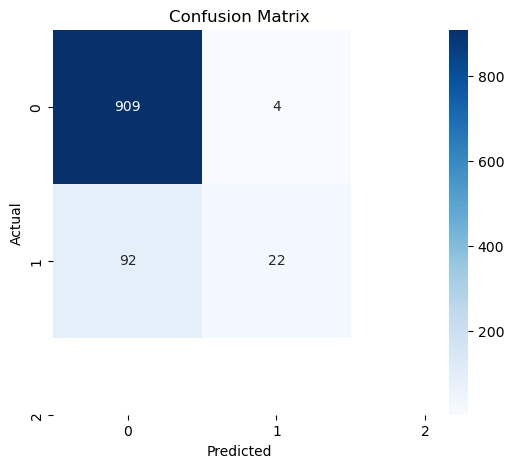

In [54]:
optimal_k=5
knn=KNeighborsClassifier(n_neighbors=optimal_k)
knn.fit(x_train, y_train)
y_test_pred=knn.predict(x_test)
cm=confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True,fmt='d',cmap='Blues',xticklabels=range(3),yticklabels=range(3))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## SVM

In [55]:
from sklearn.svm import SVC

In [56]:
svc=SVC()

In [57]:
params={'gamma':[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]}
grid_search=GridSearchCV(svc,params)
grid_search.fit(x_train,y_train)
grid_search.best_params_

{'gamma': 0.1}

In [58]:
params=dict(C=range(1,10))
grid_search=GridSearchCV(svc,params)
grid_search.fit(x_train,y_train)
grid_search.best_params_

{'C': 5}

In [59]:
params={'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}
grid_search=GridSearchCV(svc,params)
grid_search.fit(x_train,y_train)
grid_search.best_params_

{'kernel': 'poly'}

In [60]:
svc=SVC(C=5,kernel='poly',gamma=0.1)

In [61]:
svc.fit(x_train,y_train)

SVC(C=5, gamma=0.1, kernel='poly')

In [62]:
y_test_predict=svc.predict(x_test)

In [63]:
y_train_pred=svc.predict(x_train)

In [64]:
train_accuracy=accuracy_score(y_train,y_train_pred)
test_accuracy=accuracy_score(y_test,y_test_pred)

In [65]:
print(train_accuracy)
print(test_accuracy)

0.9977272727272727
0.9065238558909445


In [66]:
print("\nConfusion Matrix:")
print(confusion_matrix(y_test,y_test_pred))


Confusion Matrix:
[[909   4]
 [ 92  22]]


## Decision Tree

In [71]:
from sklearn.tree import DecisionTreeClassifier,plot_tree

In [73]:
dec_tree=DecisionTreeClassifier()

In [75]:
param_grid = {'criterion': ['gini', 'entropy', 'log_loss'], 'max_depth': [1,2,3,4,5,6,7,8,9,10],'min_samples_split': [1,2,3,4,5,6,7,8,9,10],'min_samples_leaf': [1, 2, 4],'max_features': ['sqrt', 'log2'],'splitter': ['best', 'random']}
grid_search = GridSearchCV(dec_tree, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(x_train, y_train)
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'criterion': 'log_loss', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 6, 'splitter': 'best'}


In [77]:
dec_tree=DecisionTreeClassifier(criterion='log_loss',splitter='best',max_depth=10,min_samples_leaf=4,min_samples_split=6,max_features='sqrt')

In [78]:
dec_tree.fit(x_train,y_train)

DecisionTreeClassifier(criterion='log_loss', max_depth=10, max_features='sqrt',
                       min_samples_leaf=4, min_samples_split=6)

In [79]:
y_test_pred=dec_tree.predict(x_test)
y_train_pred=dec_tree.predict(x_train)

In [80]:
train_accuracy=accuracy_score(y_train,y_train_pred)
test_accuracy=accuracy_score(y_test,y_test_pred)

In [81]:
print(train_accuracy)
print(test_accuracy)

0.9613636363636363
0.928919182083739


In [82]:
print("\nConfusion Matrix:")
print(confusion_matrix(y_test,y_test_pred))


Confusion Matrix:
[[888  25]
 [ 48  66]]


In [83]:
print("\nClassification Report:")
print(classification_report(y_test,y_test_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       913
           1       0.73      0.58      0.64       114

    accuracy                           0.93      1027
   macro avg       0.84      0.78      0.80      1027
weighted avg       0.92      0.93      0.93      1027



In [104]:
class_names = df[df.columns[-1]].unique().astype(str).tolist()

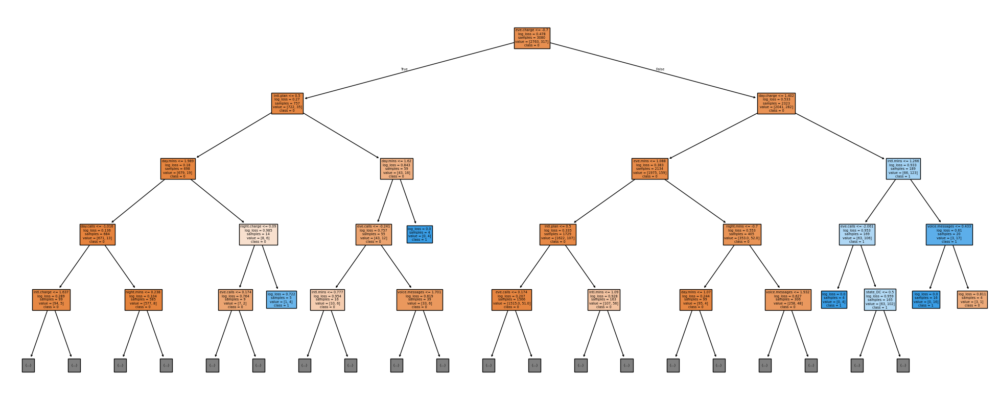

In [107]:
plt.figure(figsize=(25,10))
plot_tree(dec_tree,feature_names=list(features),filled=True,max_depth=4,class_names=class_names);

## NB

In [126]:
from sklearn.naive_bayes import BernoulliNB

In [127]:
bern=BernoulliNB()

In [128]:
bern.fit(x_train,y_train)

BernoulliNB()

In [129]:
#prediction of bernoulli's NB 
y_test_pred=bern.predict(x_test)
y_train_pred=bern.predict(x_train)

In [130]:
#accuracy for bernoulli's NB 
train_accuracy=accuracy_score(y_train,y_train_pred)
test_accuracy=accuracy_score(y_test,y_test_pred)

In [131]:
print(train_accuracy)
print(test_accuracy)

0.8954545454545455
0.8880233690360273
